  # Régression Multivariée (x1, x2) - Gradient Descent

In [103]:
import numpy as np
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt
import pandas as pd
%matplotlib inline

In [104]:
dataset = pd.read_csv("Advertising.csv")

In [105]:
dataset

,TV,Radio,Newspaper,Sales
0,230.1,37.8,69.2,22.1
1,44.5,39.3,45.1,10.4
2,17.2,45.9,69.3,12.0
3,151.5,41.3,58.5,16.5
4,180.8,10.8,58.4,17.9
...,...,...,...,...
195,38.2,3.7,13.8,7.6
196,94.2,4.9,8.1,14.0
197,177.0,9.3,6.4,14.8
198,283.6,42.0,66.2,25.5


In [106]:
x = dataset[["TV","Newspaper","Radio"]]
y = dataset["Sales"]
print(x)
print(y)

        TV  Newspaper  Radio
0    230.1       69.2   37.8
1     44.5       45.1   39.3
2     17.2       69.3   45.9
3    151.5       58.5   41.3
4    180.8       58.4   10.8
..     ...        ...    ...
195   38.2       13.8    3.7
196   94.2        8.1    4.9
197  177.0        6.4    9.3
198  283.6       66.2   42.0
199  232.1        8.7    8.6

[200 rows x 3 columns]
0      22.1
1      10.4
2      12.0
3      16.5
4      17.9
       ... 
195     7.6
196    14.0
197    14.8
198    25.5
199    18.4
Name: Sales, Length: 200, dtype: float64


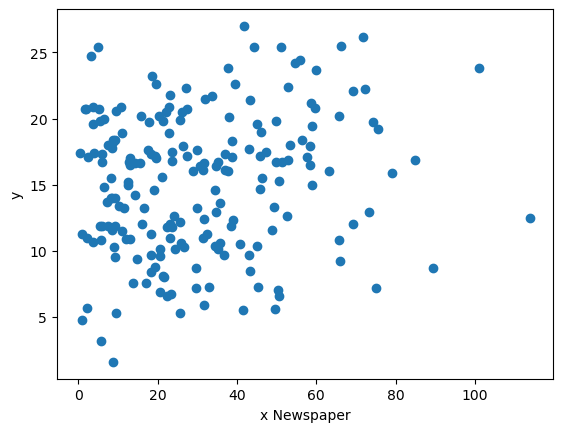

In [107]:
plt.scatter(x["Newspaper"], y)
plt.xlabel('x Newspaper')
plt.ylabel('y')
plt.show()

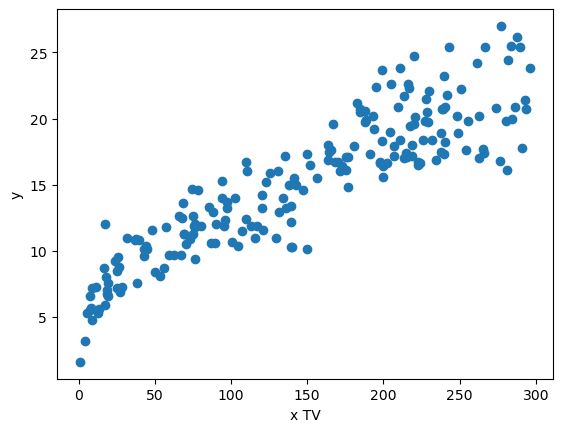

In [108]:
plt.scatter(x["TV"], y)
plt.xlabel('x TV')
plt.ylabel('y')
plt.show()

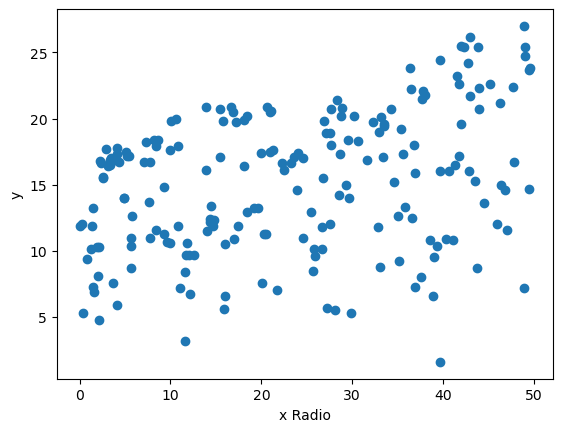

In [109]:
plt.scatter(x["Radio"], y)
plt.xlabel('x Radio')
plt.ylabel('y')
plt.show()

In [110]:
# Verification des dimensions
print(x.shape)
print(y.shape)

# redimensionner y
y = y.values.reshape(y.shape[0], 1)
print(y.shape)

(200, 3)
(200,)
(200, 1)


In [111]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2,random_state=42)
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)




(160, 3)
(40, 3)
(160, 1)
(40, 1)


In [112]:
# Création de la matrice X, inclut le Biais
X = np.hstack((x, np.ones((x.shape[0], 1)))) # ajoute un vecteur Biais de dimension (x.shape[0], 1)

print(X.shape)
print(X[:10])

(200, 4)
[[230.1  69.2  37.8   1. ]
 [ 44.5  45.1  39.3   1. ]
 [ 17.2  69.3  45.9   1. ]
 [151.5  58.5  41.3   1. ]
 [180.8  58.4  10.8   1. ]
 [  8.7  75.   48.9   1. ]
 [ 57.5  23.5  32.8   1. ]
 [120.2  11.6  19.6   1. ]
 [  8.6   1.    2.1   1. ]
 [199.8  21.2   2.6   1. ]]


In [113]:
# Initialisation du vecteur theta aléatoire, avec 3 éléments (car X a trois colonnes)
theta = np.random.randn(4 , 1)
theta

array([[ 1.08629327],
       [ 1.17919351],
       [-1.42286234],
       [-1.98664252]])

## 2. Modèle Linéaire
On implémente un modèle selon l'équation matricielle F=X.θ et puis on teste le modèle initiale défini par la valeur initiale de θ qu'on a initialisé d'une manière aléatoire.

In [114]:
def model(X, theta):
    return X.dot(theta)

## 3. Fonction coût : Erreur Quadratique Moyenne
On mesure les erreurs du modele sur le Dataset X, y en implémenterl'erreur quadratique moyenne, Mean Squared Error (MSE) en anglais.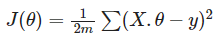


In [115]:
def cost_function(X, y, theta):
    m = len(y)
    return 1/(2*m) * np.sum((model(X, theta) - y)**2)

In [116]:
cost_function(X, y, theta)

14894.484625952351

## 4. Gradients et Descente de Gradient
On implémente la formule du gradient pour la MSE. Ensuite on utilise cette fonction dans la descente de gradient:
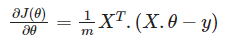

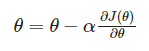

In [117]:
def grad(X, y, theta):
    m = len(y)
    return 1/m * X.T.dot(model(X, theta) - y)

In [118]:
def gradient_descent(X, y, theta, learning_rate, n_iterations):
    
    cost_history = np.zeros(n_iterations) # création d'un tableau de stockage pour enregistrer l'évolution du Cout du modele
    
    for i in range(0, n_iterations):
        gradient = grad(X, y, theta)
        learning_rate = 0.01 / (1 + np.linalg.norm(gradient))  # Adjust learning rate
        theta = theta - learning_rate * gradient # mise a jour du parametre theta (formule du gradient descent)
        cost_history[i] = cost_function(X, y, theta) # on enregistre la valeur du Cout au tour i dans cost_history[i]
        print('learning_rate' , learning_rate)
        print('theta' , theta)
        print(cost_history[i])
    return theta, cost_history

## 5. Phase d'entrainement
On définit un nombre d'itérations, ainsi qu'un pas d'apprentissage α. Une fois le modele entrainé, on observe les resultats par rapport a notre Dataset

In [ ]:
n_iterations = 1000000
learning_rate = 0.001

theta_final, cost_history = gradient_descent(X, y, theta, learning_rate, n_iterations)

learning_rate 3.380084952897465e-07
theta [[ 1.07649562]
 [ 1.17752453]
 [-1.42396302]
 [-1.98669172]]
14600.160688942364
learning_rate 3.414866437361411e-07
theta [[ 1.06669798]
 [ 1.17585488]
 [-1.4250626 ]
 [-1.9867409 ]]
14308.850076471623
learning_rate 3.4503710439213544e-07
theta [[ 1.05690032]
 [ 1.17418453]
 [-1.42616104]
 [-1.98679007]]
14020.552777303434
learning_rate 3.48662155641899e-07
theta [[ 1.04710266]
 [ 1.17251347]
 [-1.42725833]
 [-1.98683923]]
13735.268779858738
learning_rate 3.523641725834594e-07
theta [[ 1.037305  ]
 [ 1.17084169]
 [-1.42835444]
 [-1.98688837]]
13452.998072201806
learning_rate 3.561456322145024e-07
theta [[ 1.02750733]
 [ 1.16916917]
 [-1.42944934]
 [-1.98693751]]
13173.740642025206
learning_rate 3.6000911895540254e-07
theta [[ 1.01770965]
 [ 1.16749591]
 [-1.43054302]
 [-1.98698662]]
12897.496476633925
learning_rate 3.6395733053534535e-07
theta [[ 1.00791197]
 [ 1.16582187]
 [-1.43163544]
 [-1.98703573]]
12624.265562928678
learning_rate 3.679930

KeyboardInterrupt: 

In [ ]:
# création d'un vecteur prédictions qui contient les prédictions de notre modele final
predictions = model(X, theta_final)

theta_final

array([[ 0.0675198 ],
       [ 0.02941483],
       [ 0.16192113],
       [-0.16234347]])

In [ ]:
#%matplotlib notebook
# fig = plt.figure()
# ax = fig.add_subplot(111, projection='3d')
# ax.scatter(x[:,"Newspaper"], x[:,""], y)
# ax.scatter(x[:,"Newspaper"], x[:,""], predictions)
# # affiche les noms des axes
# ax.set_xlabel('x_1')
# ax.set_ylabel('x_2')
# ax.set_zlabel('y')

## 6. Courbe d'apprentissage

   Pour vérifier si notre algorithme de Descente de gradient a bien fonctionné, on observe l'évolution de la fonction cout a travers les itérations. On est sensé obtenir une courbe qui diminue a chaque itération jusqu'a stagner a un niveau minimal (proche de zéro). Si la courbe ne suit pas ce motif, alors le pas learning_rate est peut-etre trop élevé, il faut prendre un pas plus faible.

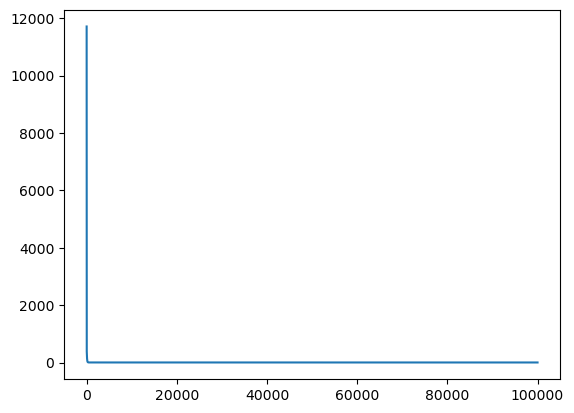

In [ ]:
plt.plot(range(n_iterations), cost_history)
plt.show()

## 7. Evaluation du modèle - Coefficient de détermination

   Le coefficient de détermination est un indice de la qualité de la prédiction de la régression polynomiale. Le coefficient de détermination se sit!ue entre 0 et 1. Plus il est proche de 1, plus la régression polynomiale est en adéquation avec les données collectées.

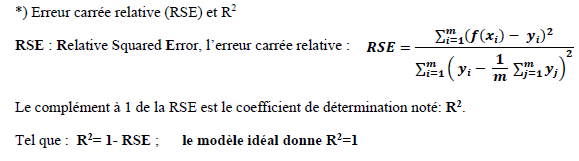

In [ ]:
def coef_determination(y, pred):
    u = ((y - pred)**2).sum()
    v = ((y - y.mean())**2).sum()
    return 1 - u/v

In [ ]:
coef_determination(y, predictions)

0.7821265624181847